# Network Anomaly Detection - Unsupervised Machine Learning Modeling

**Problem Statement**
>In the realm of cybersecurity, network anomaly detection is a critical task that involves identifying unusual patterns or behaviors that deviate from the norm within network traffic.
These anomalies could signify a range of security threats, from compromised devices and malware infections to large-scale cyber-attacks like DDoS (Distributed Denial of Service). The challenge lies in accurately detecting these anomalies in real-time, amidst the vast and continuous streams of network data, which are often noisy and heterogeneous. 
The traditional methods of network anomaly detection often rely on predefined rules or signatures based on known attack patterns. However, these methods fall short in detecting new or evolving threats that do not match the existing signatures. Furthermore, as network environments grow in complexity, maintaining and updating these rules becomes increasingly 
cumbersome and less effective. 

**Import required Libraries**

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math

pd.set_option('display.max_columns', None)
#pd.set_option('display.max_rows', None)
#pd.set_option("display.precision", 2)

import warnings
warnings.filterwarnings("ignore")

In [142]:
import os
from sklearn.neighbors import LocalOutlierFactor
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import MinMaxScaler
from sklearn.utils import class_weight

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

#Accuracy score, confusion matrix, classification report, ROC curve, AUC
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, roc_auc_score, auc
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score

from statsmodels.stats.outliers_influence import variance_inflation_factor
from imblearn.over_sampling import SMOTE

In [128]:
from sklearn.metrics import (plot_confusion_matrix, plot_roc_curve)

**High Level Overview and basic info of the Dataset**

In [451]:
df = pd.read_csv("Network_anomaly_data.csv")
df.head(4)

,duration,protocoltype,service,flag,srcbytes,dstbytes,land,wrongfragment,urgent,hot,numfailedlogins,loggedin,numcompromised,rootshell,suattempted,numroot,numfilecreations,numshells,numaccessfiles,numoutboundcmds,ishostlogin,isguestlogin,count,srvcount,serrorrate,srvserrorrate,rerrorrate,srvrerrorrate,samesrvrate,diffsrvrate,srvdiffhostrate,dsthostcount,dsthostsrvcount,dsthostsamesrvrate,dsthostdiffsrvrate,dsthostsamesrcportrate,dsthostsrvdiffhostrate,dsthostserrorrate,dsthostsrvserrorrate,dsthostrerrorrate,dsthostsrvrerrorrate,attack,lastflag
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,0.0,0.0,0.0,0.0,1.00,0.00,0.0,150,25,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,normal,20
1,0,udp,other,SF,146,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,13,1,0.0,0.0,0.0,0.0,0.08,0.15,0.0,255,1,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal,15
2,0,tcp,private,S0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,123,6,1.0,1.0,0.0,0.0,0.05,0.07,0.0,255,26,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,19
3,0,tcp,http,SF,232,8153,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,5,5,0.2,0.2,0.0,0.0,1.00,0.00,0.0,30,255,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal,21


In [445]:
df.shape

(125973, 43)

In [446]:
df.isnull().sum().sum()

np.int64(0)

## Summary Statistics

In [447]:
df.describe(include = ['int64', 'float64'])

,duration,srcbytes,dstbytes,land,wrongfragment,urgent,hot,numfailedlogins,loggedin,numcompromised,rootshell,suattempted,numroot,numfilecreations,numshells,numaccessfiles,numoutboundcmds,ishostlogin,isguestlogin,count,srvcount,serrorrate,srvserrorrate,rerrorrate,srvrerrorrate,samesrvrate,diffsrvrate,srvdiffhostrate,dsthostcount,dsthostsrvcount,dsthostsamesrvrate,dsthostdiffsrvrate,dsthostsamesrcportrate,dsthostsrvdiffhostrate,dsthostserrorrate,dsthostsrvserrorrate,dsthostrerrorrate,dsthostsrvrerrorrate,lastflag
count,125973.00000,1.259730e+05,1.259730e+05,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.0,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000
mean,287.14465,4.556674e+04,1.977911e+04,0.000198,0.022687,0.000111,0.204409,0.001222,0.395736,0.279250,0.001342,0.001103,0.302192,0.012669,0.000413,0.004096,0.0,0.000008,0.009423,84.107555,27.737888,0.284485,0.282485,0.119958,0.121183,0.660928,0.063053,0.097322,182.148945,115.653005,0.521242,0.082951,0.148379,0.032542,0.284452,0.278485,0.118832,0.120240,19.504060
std,2604.51531,5.870331e+06,4.021269e+06,0.014086,0.253530,0.014366,2.149968,0.045239,0.489010,23.942042,0.036603,0.045154,24.399618,0.483935,0.022181,0.099370,0.0,0.002817,0.096612,114.508607,72.635840,0.446456,0.447022,0.320436,0.323647,0.439623,0.180314,0.259830,99.206213,110.702741,0.448949,0.188922,0.308997,0.112564,0.444784,0.445669,0.306557,0.319459,2.291503
min,0.00000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.00000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.090000,0.000000,0.000000,82.000000,10.000000,0.050000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18.000000
50%,0.00000,4.400000e+01,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,14.000000,8.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,255.000000,63.000000,0.510000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.000000
75%,0.00000,2.760000e+02,5.160000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,143.000000,18.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.060000,0.000000,255.000000,255.000000,1.000000,0.070000,0.060000,0.020000,1.000000,1.000000,0.000000,0.000000,21.000000
max,42908.00000,1.379964e+09,1.309937e+09,1.000000,3.000000,3.000000,77.000000,5.000000,1.000000,7479.000000,1.000000,2.000000,7468.000000,43.000000,2.000000,9.000000,0.0,1.000000,1.000000,511.000000,511.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,255.000000,255.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,21.000000


In [448]:
df.describe(include= 'object')

,protocoltype,service,flag,attack
count,125973,125973,125973,125973
unique,3,70,11,23
top,tcp,http,SF,normal
freq,102689,40338,74945,67343


### **Data Pre-processing**

**The following is the attack categorization:**
###### DoS :	Denial of service is a malicious attack aimed at preventing normal users from using a service by making it inaccessible.
###### Probe:	Probe or surveillance is an attack that her purpose is to obtain important information about the security of networks in order to
######       change with the security settings.
###### R2L:	This class of attacks tries to gain local unauthorized access to a remote machine by sends packets to the network.
###### U2R	: The primary purpose of this attack is to illegally explore or steal data, install viruses, or cause the sufferer to suffer harm by introduction a normal user account.

###### DOS : ['neptune', 'back', 'land', 'pod', 'smurf', 'teardrop', 'udpstorm', 'mailbomb', 'apache2', 'processtable', 'worm']
###### Probe : ['ipsweep', 'nmap', 'portsweep', 'satan', 'mscan', 'saint']
###### R2L :['ftp_write','guess_passwd','imap','multihop','phf','spy','warezclient','warezmaster','sendmail','named','snmpgetattack','snmpguess',
######       'xlock','xsnoop', 'httptunnel']
###### U2R : ['buffer_overflow', 'Loadmodule', 'perl', 'rootkit','ps', 'sqlattack', 'xterm']

**Mapping the Target variable**

In [452]:
attack_mapping = {'back': 'dos',    'buffer_overflow': 'u2r',     'ftp_write': 'r2l',    'guess_passwd': 'r2l',    'imap': 'r2l',
    'ipsweep': 'probe',    'land': 'dos',    'loadmodule': 'u2r',    'multihop': 'r2l',    'neptune': 'dos',    'nmap': 'probe',
    'perl': 'u2r',    'phf': 'r2l',    'pod': 'dos',    'portsweep': 'probe',    'rootkit': 'u2r',    'satan': 'probe',
    'smurf': 'dos',    'spy': 'r2l',    'teardrop': 'dos',    'warezclient': 'r2l',    'warezmaster': 'r2l',    'normal': 'normal'}
df['attack_category'] = df['attack'].map(attack_mapping)
category_distribution = df['attack_category'].value_counts()
category_distribution

attack_category
normal    67343
dos       45927
probe     11656
r2l         995
u2r          52
Name: count, dtype: int64

#### Post broad level categorization, creating final label for 'atttack' variable with values - "attack_" or "normal_" (benign)

In [454]:
label_mapping = {'normal' : 'normal_', 'dos' : 'attack_', 'probe': 'attack_', 'r2l' : 'attack_', 'u2r' : 'attack_'}
df['target'] = df['attack_category'].map(label_mapping)
df['target'].value_counts(normalize = True)

target
normal_    0.534583
attack_    0.465417
Name: proportion, dtype: float64

**Conclusion:**
There is around 53% data for normal transactions and 47% data for attack in the dataset.

### **Feature Engineeting**

In [453]:
#Creating feature for different service
df['Differentservice'] =  df['dsthostcount']*df['dsthostdiffsrvrate']

### **Outlier Detection**

In [360]:
#Seperating the categorical variables before Outlier detection.
for_dummy = df[['protocoltype', 'service', 'flag', 'target']]
for_dummy.head()

,protocoltype,service,flag,target
0,tcp,ftp_data,SF,normal
1,udp,other,SF,normal
2,tcp,private,S0,attack_
3,tcp,http,SF,normal
4,tcp,http,SF,normal


In [361]:
#Retaining only numerical columns for LOF detection
data = df.drop(['protocoltype', 'service', 'flag', 'target'], axis = 1)
data.head(2)

,duration,srcbytes,dstbytes,land,wrongfragment,urgent,hot,numfailedlogins,loggedin,numcompromised,rootshell,suattempted,numroot,numfilecreations,numshells,numaccessfiles,numoutboundcmds,ishostlogin,isguestlogin,count,srvcount,serrorrate,srvserrorrate,rerrorrate,srvrerrorrate,samesrvrate,diffsrvrate,srvdiffhostrate,dsthostcount,dsthostsrvcount,dsthostsamesrvrate,dsthostdiffsrvrate,dsthostsamesrcportrate,dsthostsrvdiffhostrate,dsthostserrorrate,dsthostsrvserrorrate,dsthostrerrorrate,dsthostsrvrerrorrate,lastflag,Differentservice
0,0,491,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,0.0,0.0,0.0,0.0,1.00,0.00,0.0,150,25,0.17,0.03,0.17,0.0,0.0,0.0,0.05,0.0,20,4.5
1,0,146,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,13,1,0.0,0.0,0.0,0.0,0.08,0.15,0.0,255,1,0.00,0.60,0.88,0.0,0.0,0.0,0.00,0.0,15,153.0


### **Outlier Detection using Local outlier Factor**

In [362]:
clf = LocalOutlierFactor(n_neighbors=25, contamination=0.08).fit_predict(data.iloc[:, :2])
data['is_outlier_lof'] = clf
print("number of outliers : ",(len(data[data['is_outlier_lof'] == -1]), (data['is_outlier_lof'] == -1).sum()))

number of outliers :  (10078, np.int64(10078))


In [65]:
data = pd.concat([data,for_dummy], axis = 1).reset_index()
data.head()

,index,duration,srcbytes,dstbytes,land,wrongfragment,urgent,hot,numfailedlogins,loggedin,numcompromised,rootshell,suattempted,numroot,numfilecreations,numshells,numaccessfiles,numoutboundcmds,ishostlogin,isguestlogin,count,srvcount,serrorrate,srvserrorrate,rerrorrate,srvrerrorrate,samesrvrate,diffsrvrate,srvdiffhostrate,dsthostcount,dsthostsrvcount,dsthostsamesrvrate,dsthostdiffsrvrate,dsthostsamesrcportrate,dsthostsrvdiffhostrate,dsthostserrorrate,dsthostsrvserrorrate,dsthostrerrorrate,dsthostsrvrerrorrate,lastflag,Differentservice,is_outlier_lof,protocoltype,service,flag,target
0,0,0,491,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,0.0,0.0,0.0,0.0,1.00,0.00,0.00,150,25,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,20,4.50,1,tcp,ftp_data,SF,normal
1,1,0,146,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,13,1,0.0,0.0,0.0,0.0,0.08,0.15,0.00,255,1,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,15,153.00,1,udp,other,SF,normal
2,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,123,6,1.0,1.0,0.0,0.0,0.05,0.07,0.00,255,26,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,19,12.75,1,tcp,private,S0,attack_
3,3,0,232,8153,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,5,5,0.2,0.2,0.0,0.0,1.00,0.00,0.00,30,255,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,21,0.00,1,tcp,http,SF,normal
4,4,0,199,420,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,30,32,0.0,0.0,0.0,0.0,1.00,0.00,0.09,255,255,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,21,0.00,1,tcp,http,SF,normal


In [66]:
#Split the categorical columns
Categorical_columns = data[['index','protocoltype', 'service', 'flag', 'target','is_outlier_lof']]
Categorical_columns.head(2)

,index,protocoltype,service,flag,target,is_outlier_lof
0,0,tcp,ftp_data,SF,normal,1
1,1,udp,other,SF,normal,1


In [70]:
# Exclude the outliers from dataset
data = data[data['is_outlier_lof'] == 1]
data.shape

(115895, 42)

In [71]:
# Exclude the outliers from categorical columns
Categorical_columns = Categorical_columns[Categorical_columns['is_outlier_lof'] == 1]
Categorical_columns.shape

(115895, 6)

In [72]:
#Concate the data on Index
data = pd.concat([data,Categorical_columns], axis = 1)
data.head()

,index,duration,srcbytes,dstbytes,land,wrongfragment,urgent,hot,numfailedlogins,loggedin,numcompromised,rootshell,suattempted,numroot,numfilecreations,numshells,numaccessfiles,numoutboundcmds,ishostlogin,isguestlogin,count,srvcount,serrorrate,srvserrorrate,rerrorrate,srvrerrorrate,samesrvrate,diffsrvrate,srvdiffhostrate,dsthostcount,dsthostsrvcount,dsthostsamesrvrate,dsthostdiffsrvrate,dsthostsamesrcportrate,dsthostsrvdiffhostrate,dsthostserrorrate,dsthostsrvserrorrate,dsthostrerrorrate,dsthostsrvrerrorrate,lastflag,Differentservice,is_outlier_lof,index,protocoltype,service,flag,target,is_outlier_lof
0,0,0,491,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,0.0,0.0,0.0,0.0,1.00,0.00,0.00,150,25,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,20,4.50,1,0,tcp,ftp_data,SF,normal,1
1,1,0,146,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,13,1,0.0,0.0,0.0,0.0,0.08,0.15,0.00,255,1,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,15,153.00,1,1,udp,other,SF,normal,1
2,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,123,6,1.0,1.0,0.0,0.0,0.05,0.07,0.00,255,26,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,19,12.75,1,2,tcp,private,S0,attack_,1
3,3,0,232,8153,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,5,5,0.2,0.2,0.0,0.0,1.00,0.00,0.00,30,255,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,21,0.00,1,3,tcp,http,SF,normal,1
4,4,0,199,420,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,30,32,0.0,0.0,0.0,0.0,1.00,0.00,0.09,255,255,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,21,0.00,1,4,tcp,http,SF,normal,1


In [43]:
data.shape

(115895, 48)

In [73]:
#Again split the data
categorical_cols = data[['index','protocoltype', 'service', 'flag', 'target','is_outlier_lof']]
data = data.drop(['index','protocoltype', 'service', 'flag', 'target', 'is_outlier_lof'], axis = 1)
data.head(6)

,duration,srcbytes,dstbytes,land,wrongfragment,urgent,hot,numfailedlogins,loggedin,numcompromised,rootshell,suattempted,numroot,numfilecreations,numshells,numaccessfiles,numoutboundcmds,ishostlogin,isguestlogin,count,srvcount,serrorrate,srvserrorrate,rerrorrate,srvrerrorrate,samesrvrate,diffsrvrate,srvdiffhostrate,dsthostcount,dsthostsrvcount,dsthostsamesrvrate,dsthostdiffsrvrate,dsthostsamesrcportrate,dsthostsrvdiffhostrate,dsthostserrorrate,dsthostsrvserrorrate,dsthostrerrorrate,dsthostsrvrerrorrate,lastflag,Differentservice
0,0,491,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,0.0,0.0,0.0,0.0,1.00,0.00,0.00,150,25,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,20,4.50
1,0,146,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,13,1,0.0,0.0,0.0,0.0,0.08,0.15,0.00,255,1,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,15,153.00
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,123,6,1.0,1.0,0.0,0.0,0.05,0.07,0.00,255,26,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,19,12.75
3,0,232,8153,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,5,5,0.2,0.2,0.0,0.0,1.00,0.00,0.00,30,255,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,21,0.00
4,0,199,420,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,30,32,0.0,0.0,0.0,0.0,1.00,0.00,0.09,255,255,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,21,0.00
5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,121,19,0.0,0.0,1.0,1.0,0.16,0.06,0.00,255,19,0.07,0.07,0.00,0.00,0.00,0.00,1.00,1.00,21,17.85


In [52]:
data.shape

(115895, 40)

### Box Cox Transformation

In [74]:
transformer = PowerTransformer(method='yeo-johnson')  # Use 'box-cox' if data is strictly positive
X_cols=data.columns
X = transformer.fit_transform(data)

In [78]:
# X = X.drop(X.columns[0], axis=1)
X=pd.DataFrame(X)

In [79]:
X.columns=X_cols
X.tail()

,duration,srcbytes,dstbytes,land,wrongfragment,urgent,hot,numfailedlogins,loggedin,numcompromised,rootshell,suattempted,numroot,numfilecreations,numshells,numaccessfiles,numoutboundcmds,ishostlogin,isguestlogin,count,srvcount,serrorrate,srvserrorrate,rerrorrate,srvrerrorrate,samesrvrate,diffsrvrate,srvdiffhostrate,dsthostcount,dsthostsrvcount,dsthostsamesrvrate,dsthostdiffsrvrate,dsthostsamesrcportrate,dsthostsrvdiffhostrate,dsthostserrorrate,dsthostsrvserrorrate,dsthostrerrorrate,dsthostsrvrerrorrate,lastflag,Differentservice
115890,-0.176958,-1.066186,-0.844617,-0.014689,-0.097439,0.0,-0.121793,-0.018812,-0.756315,-0.092157,-0.023321,-0.008309,-0.063948,-0.027878,-0.018347,-0.045743,0.0,0.0,-0.063333,1.062767,0.859102,1.492217,1.500082,-0.386795,-0.388924,-1.153190,0.838994,-0.49291,0.706576,-0.475739,-0.908102,0.574534,-0.660351,-0.585791,1.500698,1.521626,-0.434472,-0.401891,-0.011327,0.848201
115891,5.659439,0.676835,0.860019,-0.014689,-0.097439,0.0,-0.121793,-0.018812,-0.756315,-0.092157,-0.023321,-0.008309,-0.063948,-0.027878,-0.018347,-0.045743,0.0,0.0,-0.063333,-1.118944,-1.009522,-0.689217,-0.677131,-0.386795,-0.388924,0.821203,-0.785176,-0.49291,0.706576,1.045053,0.959131,-0.624739,-0.450815,-0.585791,-0.693331,-0.666258,-0.434472,-0.401891,0.904275,-0.106222
115892,-0.176958,1.521979,1.049172,-0.014689,-0.097439,0.0,-0.121793,-0.018812,1.322201,-0.092157,-0.023321,-0.008309,-0.063948,-0.027878,-0.018347,-0.045743,0.0,0.0,-0.063333,-1.331509,-1.489970,-0.689217,-0.677131,-0.386795,-0.388924,0.821203,-0.785176,-0.49291,0.706576,-0.377838,-0.854048,0.574534,-0.660351,-0.585791,1.360977,-0.666258,-0.135118,-0.401891,-1.157508,0.848201
115893,-0.176958,-1.066186,-0.844617,-0.014689,-0.097439,0.0,-0.121793,-0.018812,-0.756315,-0.092157,-0.023321,-0.008309,-0.063948,-0.027878,-0.018347,-0.045743,0.0,0.0,-0.063333,0.932749,0.068475,1.492217,1.500082,-0.386795,-0.388924,-1.275439,0.645191,-0.49291,0.706576,-1.003521,-1.103188,0.384724,-0.660351,-0.585791,1.500698,1.521626,-0.434472,-0.401891,-0.011327,0.753676
115894,-0.176958,0.787390,-0.844617,-0.014689,-0.097439,0.0,-0.121793,-0.018812,1.322201,-0.092157,-0.023321,-0.008309,-0.063948,-0.027878,-0.018347,-0.045743,0.0,0.0,-0.063333,-1.331509,-1.489970,-0.689217,-0.677131,-0.386795,-0.388924,0.821203,-0.785176,-0.49291,0.706576,0.191035,-0.396977,-0.063753,1.724785,-0.585791,-0.693331,-0.666258,-0.434472,-0.401891,0.904275,0.481642


In [94]:
df1 = X.reset_index(drop=True)
df2 = categorical_cols.reset_index(drop=True)

# Concatenate the two DataFrames side-by-side
df_combined = pd.concat([df1, df2], axis=1)

In [102]:
df_combined = pd.DataFrame(df_combined)

In [104]:
df_combined = df_combined.drop(df_combined.columns[-1], axis=1)
df_combined.columns

Index(['duration', 'srcbytes', 'dstbytes', 'land', 'wrongfragment', 'urgent',
       'hot', 'numfailedlogins', 'loggedin', 'numcompromised', 'rootshell',
       'suattempted', 'numroot', 'numfilecreations', 'numshells',
       'numaccessfiles', 'numoutboundcmds', 'ishostlogin', 'isguestlogin',
       'count', 'srvcount', 'serrorrate', 'srvserrorrate', 'rerrorrate',
       'srvrerrorrate', 'samesrvrate', 'diffsrvrate', 'srvdiffhostrate',
       'dsthostcount', 'dsthostsrvcount', 'dsthostsamesrvrate',
       'dsthostdiffsrvrate', 'dsthostsamesrcportrate',
       'dsthostsrvdiffhostrate', 'dsthostserrorrate', 'dsthostsrvserrorrate',
       'dsthostrerrorrate', 'dsthostsrvrerrorrate', 'lastflag',
       'Differentservice', 'index', 'index', 'protocoltype', 'service', 'flag',
       'target'],
      dtype='object')

In [106]:
df_combined = df_combined.drop(df_combined.columns[-5], axis=1)
df_combined.columns

Index(['duration', 'srcbytes', 'dstbytes', 'land', 'wrongfragment', 'urgent',
       'hot', 'numfailedlogins', 'loggedin', 'numcompromised', 'rootshell',
       'suattempted', 'numroot', 'numfilecreations', 'numshells',
       'numaccessfiles', 'numoutboundcmds', 'ishostlogin', 'isguestlogin',
       'count', 'srvcount', 'serrorrate', 'srvserrorrate', 'rerrorrate',
       'srvrerrorrate', 'samesrvrate', 'diffsrvrate', 'srvdiffhostrate',
       'dsthostcount', 'dsthostsrvcount', 'dsthostsamesrvrate',
       'dsthostdiffsrvrate', 'dsthostsamesrcportrate',
       'dsthostsrvdiffhostrate', 'dsthostserrorrate', 'dsthostsrvserrorrate',
       'dsthostrerrorrate', 'dsthostsrvrerrorrate', 'lastflag',
       'Differentservice', 'protocoltype', 'service', 'flag', 'target'],
      dtype='object')

In [97]:
df_combined['target'].unique()

array(['normal', 'attack_'], dtype=object)

In [ ]:
# Create Dummy variables for Categorical variables

In [107]:
dummies = ['protocoltype', 'service', 'flag', 'target']
scaled_df = pd.get_dummies(df_combined, columns=dummies, drop_first=True)
scaled_df.head()

,duration,srcbytes,dstbytes,land,wrongfragment,urgent,hot,numfailedlogins,loggedin,numcompromised,rootshell,suattempted,numroot,numfilecreations,numshells,numaccessfiles,numoutboundcmds,ishostlogin,isguestlogin,count,srvcount,serrorrate,srvserrorrate,rerrorrate,srvrerrorrate,samesrvrate,diffsrvrate,srvdiffhostrate,dsthostcount,dsthostsrvcount,dsthostsamesrvrate,dsthostdiffsrvrate,dsthostsamesrcportrate,dsthostsrvdiffhostrate,dsthostserrorrate,dsthostsrvserrorrate,dsthostrerrorrate,dsthostsrvrerrorrate,lastflag,Differentservice,protocoltype_tcp,protocoltype_udp,service_X11,service_Z39_50,service_aol,service_auth,service_bgp,service_courier,service_csnet_ns,service_ctf,service_daytime,service_discard,service_domain,service_domain_u,service_echo,service_eco_i,service_ecr_i,service_efs,service_exec,service_finger,service_ftp,service_ftp_data,service_gopher,service_harvest,service_hostnames,service_http,service_http_2784,service_http_443,service_http_8001,service_imap4,service_iso_tsap,service_klogin,service_kshell,service_ldap,service_link,service_login,service_mtp,service_name,service_netbios_dgm,service_netbios_ns,service_netbios_ssn,service_netstat,service_nnsp,service_nntp,service_ntp_u,service_other,service_pm_dump,service_pop_2,service_pop_3,service_printer,service_private,service_red_i,service_remote_job,service_rje,service_shell,service_smtp,service_sql_net,service_ssh,service_sunrpc,service_supdup,service_systat,service_telnet,service_tftp_u,service_tim_i,service_time,service_urh_i,service_urp_i,service_uucp,service_uucp_path,service_vmnet,service_whois,flag_REJ,flag_RSTO,flag_RSTOS0,flag_RSTR,flag_S0,flag_S1,flag_S2,flag_S3,flag_SF,flag_SH,target_normal
0,-0.176958,1.127199,-0.844617,-0.014689,-0.097439,0.0,-0.121793,-0.018812,-0.756315,-0.092157,-0.023321,-0.008309,-0.063948,-0.027878,-0.018347,-0.045743,0.0,0.0,-0.063333,-1.118944,-1.009522,-0.689217,-0.677131,-0.386795,-0.388924,0.821203,-0.785176,-0.492910,-0.349127,-0.475739,-0.721957,-0.063753,1.288308,-0.585791,-0.693331,-0.666258,0.764350,-0.401891,-0.011327,0.194033,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True
1,-0.176958,0.777259,-0.844617,-0.014689,-0.097439,0.0,-0.121793,-0.018812,-0.756315,-0.092157,-0.023321,-0.008309,-0.063948,-0.027878,-0.018347,-0.045743,0.0,0.0,-0.063333,-0.308022,-1.489970,-0.689217,-0.677131,-0.386795,-0.388924,-1.245825,1.846407,-0.492910,0.706576,-1.595442,-1.189794,2.360424,2.032934,-0.585791,-0.693331,-0.666258,-0.434472,-0.401891,-1.886555,1.867751,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True
2,-0.176958,-1.066186,-0.844617,-0.014689,-0.097439,0.0,-0.121793,-0.018812,-0.756315,-0.092157,-0.023321,-0.008309,-0.063948,-0.027878,-0.018347,-0.045743,0.0,0.0,-0.063333,0.849324,-0.152231,1.492217,1.500082,-0.386795,-0.388924,-1.290010,1.010578,-0.492910,0.706576,-0.454999,-0.908102,0.384724,-0.660351,-0.585791,1.500698,1.521626,-0.434472,-0.401891,-0.678694,0.753676,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,F

In [108]:
scaled_df = scaled_df.astype(int)
scaled_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115895 entries, 0 to 115894
Columns: 122 entries, duration to target_normal
dtypes: int64(122)
memory usage: 107.9 MB


In [109]:
scaled_df.head(3)

,duration,srcbytes,dstbytes,land,wrongfragment,urgent,hot,numfailedlogins,loggedin,numcompromised,rootshell,suattempted,numroot,numfilecreations,numshells,numaccessfiles,numoutboundcmds,ishostlogin,isguestlogin,count,srvcount,serrorrate,srvserrorrate,rerrorrate,srvrerrorrate,samesrvrate,diffsrvrate,srvdiffhostrate,dsthostcount,dsthostsrvcount,dsthostsamesrvrate,dsthostdiffsrvrate,dsthostsamesrcportrate,dsthostsrvdiffhostrate,dsthostserrorrate,dsthostsrvserrorrate,dsthostrerrorrate,dsthostsrvrerrorrate,lastflag,Differentservice,protocoltype_tcp,protocoltype_udp,service_X11,service_Z39_50,service_aol,service_auth,service_bgp,service_courier,service_csnet_ns,service_ctf,service_daytime,service_discard,service_domain,service_domain_u,service_echo,service_eco_i,service_ecr_i,service_efs,service_exec,service_finger,service_ftp,service_ftp_data,service_gopher,service_harvest,service_hostnames,service_http,service_http_2784,service_http_443,service_http_8001,service_imap4,service_iso_tsap,service_klogin,service_kshell,service_ldap,service_link,service_login,service_mtp,service_name,service_netbios_dgm,service_netbios_ns,service_netbios_ssn,service_netstat,service_nnsp,service_nntp,service_ntp_u,service_other,service_pm_dump,service_pop_2,service_pop_3,service_printer,service_private,service_red_i,service_remote_job,service_rje,service_shell,service_smtp,service_sql_net,service_ssh,service_sunrpc,service_supdup,service_systat,service_telnet,service_tftp_u,service_tim_i,service_time,service_urh_i,service_urp_i,service_uucp,service_uucp_path,service_vmnet,service_whois,flag_REJ,flag_RSTO,flag_RSTOS0,flag_RSTR,flag_S0,flag_S1,flag_S2,flag_S3,flag_SF,flag_SH,target_normal
0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-1,-1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-1,0,0,0,0,-1,1,0,0,-1,-1,2,2,0,0,0,0,0,-1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
2,0,-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,-1,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0


## Machine Learning model evaluation

# UnSupervised Learning

In [ ]:
### K Means

In [281]:
data_1 = data.iloc[:5000,]
data_1.shape

(5000, 40)

In [267]:
import plotly.express as px

In [285]:
#scaled_df
from sklearn.cluster import KMeans

In [287]:
scaled_df_1 = scaled_df.iloc[:,:40]
scaled_df_1.head(2)

,duration,srcbytes,dstbytes,land,wrongfragment,urgent,hot,numfailedlogins,loggedin,numcompromised,rootshell,suattempted,numroot,numfilecreations,numshells,numaccessfiles,numoutboundcmds,ishostlogin,isguestlogin,count,srvcount,serrorrate,srvserrorrate,rerrorrate,srvrerrorrate,samesrvrate,diffsrvrate,srvdiffhostrate,dsthostcount,dsthostsrvcount,dsthostsamesrvrate,dsthostdiffsrvrate,dsthostsamesrcportrate,dsthostsrvdiffhostrate,dsthostserrorrate,dsthostsrvserrorrate,dsthostrerrorrate,dsthostsrvrerrorrate,lastflag,Differentservice
0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-1,-1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-1,0,0,0,0,-1,1,0,0,-1,-1,2,2,0,0,0,0,0,-1,1


In [294]:
k = 5
kmeans = KMeans(n_clusters=k)
kmeans.fit(X)
labels = kmeans.predict(scaled_df_1)

In [289]:
kmeans.inertia_

2538198.302538244

In [295]:
clusters = pd.DataFrame(X, columns=df.columns)
clusters['label'] = kmeans.labels_
clusters.head(3)

,duration,protocoltype,service,flag,srcbytes,dstbytes,land,wrongfragment,urgent,hot,numfailedlogins,loggedin,numcompromised,rootshell,suattempted,numroot,numfilecreations,numshells,numaccessfiles,numoutboundcmds,ishostlogin,isguestlogin,count,srvcount,serrorrate,srvserrorrate,rerrorrate,srvrerrorrate,samesrvrate,diffsrvrate,srvdiffhostrate,dsthostcount,dsthostsrvcount,dsthostsamesrvrate,dsthostdiffsrvrate,dsthostsamesrcportrate,dsthostsrvdiffhostrate,dsthostserrorrate,dsthostsrvserrorrate,dsthostrerrorrate,dsthostsrvrerrorrate,lastflag,target,Differentservice,label
0,-0.176958,NaN,NaN,NaN,1.127199,-0.844617,-0.014689,-0.097439,0.0,-0.121793,-0.018812,-0.756315,-0.092157,-0.023321,-0.008309,-0.063948,-0.027878,-0.018347,-0.045743,0.0,0.0,-0.063333,-1.118944,-1.009522,-0.689217,-0.677131,-0.386795,-0.388924,0.821203,-0.785176,-0.49291,-0.349127,-0.475739,-0.721957,-0.063753,1.288308,-0.585791,-0.693331,-0.666258,0.764350,-0.401891,-0.011327,NaN,0.194033,2
1,-0.176958,NaN,NaN,NaN,0.777259,-0.844617,-0.014689,-0.097439,0.0,-0.121793,-0.018812,-0.756315,-0.092157,-0.023321,-0.008309,-0.063948,-0.027878,-0.018347,-0.045743,0.0,0.0,-0.063333,-0.308022,-1.489970,-0.689217,-0.677131,-0.386795,-0.388924,-1.245825,1.846407,-0.49291,0.706576,-1.595442,-1.189794,2.360424,2.032934,-0.585791,-0.693331,-0.666258,-0.434472,-0.401891,-1.886555,NaN,1.867751,0
2,-0.176958,NaN,NaN,NaN,-1.066186,-0.844617,-0.014689,-0.097439,0.0,-0.121793,-0.018812,-0.756315,-0.092157,-0.023321,-0.008309,-0.063948,-0.027878,-0.018347,-0.045743,0.0,0.0,-0.063333,0.849324,-0.152231,1.492217,1.500082,-0.386795,-0.388924,-1.290010,1.010578,-0.49291,0.706576,-0.454999,-0.908102,0.384724,-0.660351,-0.585791,1.500698,1.521626,-0.434472,-0.401891,-0.678694,NaN,0.753676,4


In [455]:
k = 4
kmeans = KMeans(n_clusters=k)
kmeans.fit(X)
labels = kmeans.predict(scaled_df_1)

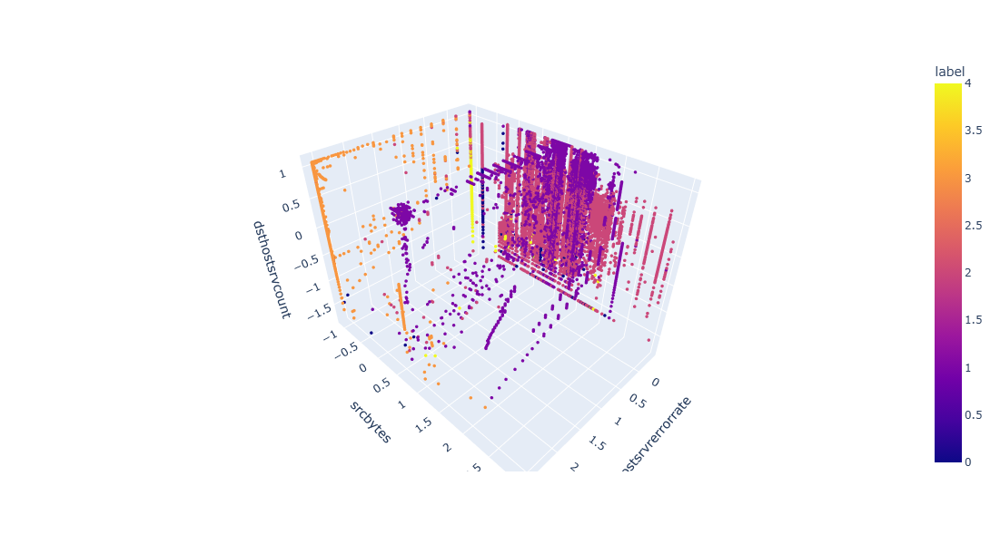

In [456]:
fig = px.scatter_3d(clusters, x='dsthostsrvrerrorrate', y='srcbytes', z='dsthostsrvcount', color='label', width=600, height=600)
fig.update_traces(marker=dict(size=2), selector=dict(mode='markers'))
fig.show()

In [298]:
wcss = []
for k in range(1, 10):
    model = KMeans(n_clusters = k)
    model.fit(X)
    wcss.append(model.inertia_)

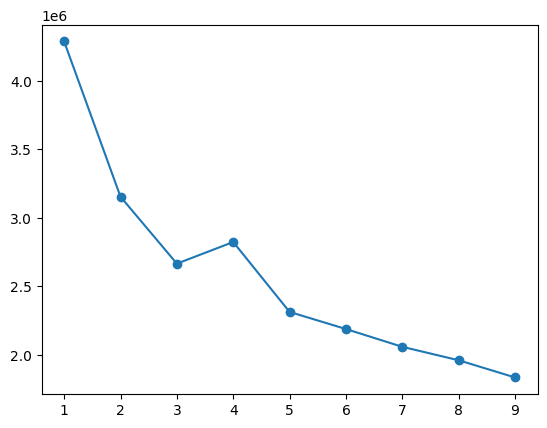

In [299]:
plt.plot(range(1, 10), wcss, '-o')

**Conclusion:**
- The elbow method is a technique used to determine the optimal number of clusters (KKK) in a clustering algorithm like K-means. It helps identify the number of clusters where adding more clusters does not significantly improve the model, thereby balancing model complexity with performance.
- Here we are getting four clusters as optimal number, plotting the clusters again for visualization.

**Final Conclusion on Model Evaluation**
- In exploring network anomaly detection, we delved into both supervised and unsupervised machine learning algorithms, each offering unique strengths in identifying and managing anomalies. Supervised classification algorithms such as Decision Trees, Logistic Regression, and XGBoost have demonstrated high accuracy in detecting known anomalies by learning from labelled data. These models excel in identifying patterns linked to historical attacks or unusual behaviours, making them effective for real-time, automated monitoring once trained. Achieving over 99% accuracy across these algorithms emphasizes the reliability and robustness of our feature engineering and model selection.
- On the other hand, unsupervised algorithms like K-Means Clustering and Local Outlier Factor (LOF) allow for more flexible anomaly detection, particularly with novel or evolving attack patterns where labelled data is unavailable. These methods identify atypical network behaviours by spotting data points that diverge from expected norms, providing an essential layer of defence against unknown or rare threats.
- By combining these supervised and unsupervised approaches, we create a more comprehensive and adaptive anomaly detection system. Supervised methods ensure high precision for known threats, while unsupervised techniques offer resilience against new, unforeseen risks. This hybrid approach, tailored to network security’s dynamic environment, provides a strong foundation for continuous monitoring and proactive threat mitigation, ensuring that networks remain secure, operational, and resilient in the face of an evolving cybersecurity landscape.
